## Importações de bibliotecas

In [1]:
import csv
import numpy as np
import copy
import pandas as pd
import matplotlib.pyplot as plt
import random
import math

import networkx as nx
import igraph as ig

## Definição das cores

Definição das cores que serão utilizadas para a visualização dos grafos. Da posição 0 até a posição 4 do vetor temos cores base para diferenciar runs e algoritmos. A cor na posição 5 é utilizada para pontos iniciais, posição 6 para pontos finais, 7 para pontos comuns entre runs/algoritmos e a posição 8 para o melhor ótimo estimado encontrado.

In [2]:
# Gradiente de Cor
colorsSpecial = ["#d6f9cc", "#97989c", "#33926e", "#5e97a8", "#7669b8", "#f77e23", "#e22126", "#126837", "#e07bc9"]

## Função para coletar os dados
Cada arquivo contêm uma run do algoritmo. 
Parâmetros de entrada:
 * pathName: string que vem antes da contagem das runs (pastas e prefixo do nome do arquivo)
 * nameFile: string que vem depois da contagem das runs (sufixo do nome do arquivo)
 * numberOfRuns: número de runs que se deseja coletar

 O nome do arquivo deve ser padronizado para seguir o formato:

 path name + number of the run + name file

 Exemplo:

 "/MAGA_GA/GA/asia/run_1_results_asia.csv"

 Neste exemplo, teriamos:

 * pathName = "/MAGA_GA/GA/asia/run_"
 * nameFile = "_results_asia.csv"
 * numberOfRuns = 1

 Saídas retornadas:

 * points: vetor com todos os pontos visitados em todas as runs
 * allRuns: vetor de vetores. Cada vetor interno contém os pontos que uma determinada run visitou

In [3]:
def getData(pathName, nameFile, numberOfRuns):
    run = []

    # Vetores para coletar todas as runs de cada método
    allRuns = []

    # Vetores para armazenar todos os pontos passados pelos métodos
    points = []

    # Passa por todos os arquivos/runs
    for i in range(numberOfRuns):
    
        path = pathName + str(i + 1) + nameFile
        with open(path, newline='') as csvfile:
            reader = csv.reader(csvfile)
            amr_csv = list(reader)
            run.clear()
    
            for line in amr_csv:
                if(line[0] != "BIC - Goal"):
                    run.append(line[0])
                    points.append(line[0])
            allRuns.append(run.copy())
    
    return points, allRuns

## Função de definição da Granularidade

Nesta função, será feito o agrupamento de pontos próximos. O espaço de solução sera granularizado e discretizado baseado no parâmetro step. A granularidade tem como objetivo ajustar a precisão das runs e focar em melhorias mais significativas. Ela também é opicional e ajustável de acordo com as necessidades da análise.

Parâmetros de entrada:

* points
* allRuns
* step: tamanho do agrupamento com que se deseja realizar a discretização

Saídas retornadas:

* newPoints: vetor de todos os pontos visitados nas runs ajustados depois da discretização
* newAllRuns: vetor de vetores. Cada vetor interno contém os pontos que uma determinada run visitou ajutados depois da discretização

Exemplo:

```
points = [0.1, 0.4, 0.7, 1, 1,2]
allRuns = [[0.1, 0.7, 1], [0.1, 0.4, 1.2]]
step = 0.5
```
 

 O espaço vai ser discretizado em grãos de 0.5, então todas as quantias serão agrupadas para os multíplos de 0.5

```
 newPoints = [0, 0.5, 1]
 allRuns = [[0, 0.5, 1], [0, 0, 1]]
```



In [4]:
def setVertixPace(points, allRuns, step):
    newPoints = []
    newAllRuns = []
    newRun = []

    pace = 1/step

    for i in range(len(points)):
        newPoints.append(int(float(points[i])*pace)/pace)
    
    for i in range(len(allRuns)):
        newRun.clear()
        for j in range(len(allRuns[i])):
            newRun.append(int(float(allRuns[i][j])*pace)/pace)
        
        newAllRuns.append(newRun.copy())
    
    return newPoints, newAllRuns

## Função de seleção dos pontos para montagem do grafo

Nesta função, é selecionado todos os pontos únicos para a montagem do grafo. Valores repetidos são descartados.

Parâmetros de entrada:
* points: todos os pontos visitados por todas as runs (pode estar discretizado ou não)

Saídas retornadas:
* validValues: vetor com todos os pontos únicos visitados. Cada valor aqui será um nó no grafo.

In [5]:
def selectValidPoints(points):
    validValues = []
    for i in range(len(points)):
        if(not(points[i] in validValues)):
            validValues.append(points[i])
    
    return validValues

## Seleção dos pontos especiais e construção dos vetores de layout

Para o layout, temos os dois principais vetores: o vetor de cor dos vértices e o vetor de forma dos vérticies.

### Vetor de cor

Como explicado anteriormente, as cores indicam diferentes pontos e runs. 
* O gradiente de cores entre as posições de 0 a 4 indicam pontos comuns, mudando sua cor entre runs ou entre algoritmos no caso da função de comparação entre algoritmos.
* A cor na posição 5 indicam os pontos iniciais de uma run.
* A cor na posição 6 indicam os pontos finais de uma run.
* A cor na posição 7 sobrepõe as anteriores, indicando pontos que são comuns entre mais de uma run e/ou algoritmo.
*A cor na posição 8 sobrepõe as anteriores e indica o melhor ótimo estimado do grafo.

### Vetor de forma

Além da cor, a forma também é utilizada como elemento visual de identificação. 

* O vértice normal é no formado de um círculo.
* Pontos iniciais são no formato de um quadrado.
* Pontos finais são no formato de um triângulo.

### Seleção dos pontos e função

A função analisa todos os valores e as runs fornecidas por parâmetro e gera os vetores explicados acima, alteraldo as cores e forma quando necessário.

In [32]:
def specialPoints(validValues, allRuns):
    firstVertixes = []
    lastVertixes = []
    commonVertixes = []

    for i in range(len(allRuns)):
        firstVertixes.append(validValues.index(allRuns[i][0]))
        lastVertixes.append(validValues.index(allRuns[i][(len(allRuns[i]) - 1)]))

    countRuns = 0
    colors = []
    shape = []

    for i in range(len(validValues)):
        countRuns = 0
        colors.append(-1)
        shape.append(-1)
        for j in range(len(allRuns)):
            if(validValues[i] in allRuns[j]):
                countRuns += 1
    
        if(countRuns > 1):
            commonVertixes.append(i)

    colorCount = 0

    sharedPoints = len(commonVertixes)

    for i in range(len(allRuns)):
        for j in range(len(allRuns[i])):
            colors[validValues.index(allRuns[i][j])] = colorsSpecial[colorCount % 5]
            shape[validValues.index(allRuns[i][j])] = 'circle'
        colorCount += 1

    for i in range(len(firstVertixes)):
        colors[firstVertixes[i]] = colorsSpecial[5]
        shape[firstVertixes[i]] = 'rectangle'

    colorCount += 1
    for i in range(len(lastVertixes)):
        colors[lastVertixes[i]] = colorsSpecial[7]
        shape[lastVertixes[i]] = 'triangle-down'
    
    colorCount += 1
    for i in range(len(commonVertixes)):
        colors[commonVertixes[i]] = colorsSpecial[6]
   
    uniqueSolutions = []
    uniqueLastVertex = []
    for i in range(len(lastVertixes)):
        if(lastVertixes[i] in commonVertixes):
            uniqueLastVertex.append(lastVertixes[i])


    totalSolutions = len(uniqueSolutions)

    indexMin = validValues.index(min(validValues))

    print(indexMin)

    colors[indexMin] = colorsSpecial[8]

    print(firstVertixes)

    return colors, shape, uniqueLastVertex, commonVertixes, sharedPoints, firstVertixes

## Construção das ligações entre os vértices

Para a construção do grafo, é preciso ter um vetor com os pares ordenados de todas as conexões. Para isso, é percorrido cada run formando os pares de suas conexões. O parâmetro radial diz respeito sobre a visualização final, adicionando conexões fantasma no centro para que todos os pontos finais de agrupem no meio. Essa formação afeta outras características de análise e deve ser utilizada com cautela. 

Ao final, temos o vetor com todas as conexões formado baseado nas conexões das runs e da posição dos nós válidos do grafo.

In [7]:
def edgesConstruction(allRuns, validValues, radial):
    vortix = []
    connections = []
    pureRuns = []
    bridges = []
    difference = []

    minValue = allRuns[0][0]
    minValueIndex = 0

    for i in range(len(allRuns)):
        for j in range(len(allRuns[i]) - 1):
            vortix.clear()
            vortix.append(validValues.index(allRuns[i][j]))
            vortix.append(validValues.index(allRuns[i][j + 1]))
            connections.append(vortix.copy())
            pureRuns.append(vortix.copy())
            difference.append(float(allRuns[i][j]) - float(allRuns[i][j + 1]))
            if(allRuns[i][j + 1] < minValue):
                minValueIndex = validValues.index(allRuns[i][j + 1])
                minValue = allRuns[i][j + 1]
    
    
    if(radial == 1):
        lastPoints = []

        for i in range(len(connections) - 1):
            if(connections[i][1] != connections[i + 1][0]):
                lastPoints.append(connections[i][1])

        lastRun = connections[len(connections) - 1][1]
        lastPoints.append(lastRun)

        lastPoints.pop(lastPoints.index(minValueIndex))
        
        singleBridge = []

        for i in range(len(lastPoints)):
            singleBridge.clear()
            singleBridge.append(lastPoints[i])
            singleBridge.append(minValueIndex)
            connections.append(singleBridge.copy())
            bridges.append(singleBridge.copy())
        
        print(minValue)
    
    return connections, bridges, difference

## Pesos dos self loops

Quando existem self-loops, eles são indicados por apenas uma seta que sai e entra no mesmo nó. É adicionado o label com o peso associado à esse loop indicando quantas vezes aquele caminho foi feito na run. Essa métrica/visualização é útil para verificar algoritmos que ficam presos em ótimos locais sem melhoras significativas.

In [8]:
def selfLoopsConstruction(connectionsSelfLoop, bridges, difference):
    connectionsFinal = []
    selfLoops = []
    selfLoopsLabels = []
    bridgesOutput = []
    newDifference = []
    notLoops = []

    for i in range(len(difference)):
        if(difference[i] != 0.0):
            newDifference.append(difference[i])

    for i in range(len(connectionsSelfLoop)):
        if(not(connectionsSelfLoop[i] in connectionsFinal)):
            connectionsFinal.append(connectionsSelfLoop[i].copy())     

    for i in range(len(connectionsFinal)):
        appear = connectionsSelfLoop.count(connectionsFinal[i])
        if(connectionsFinal[i][0] == connectionsFinal[i][1]):
            selfLoops.append(i)
            selfLoopsLabels.append(str(appear))
        else:
            notLoops.append(i)
    
    if(len(bridges) > 0):
        for i in range(len(bridges)):
            bridgesOutput.append(len(connectionsFinal) - 1 - i)
    
    return connectionsFinal, selfLoops, selfLoopsLabels, bridgesOutput

## Função para construir o grafo

Esta função ativamente desenha o grafo com todas as informações calculadas anteriormente: as conexões entre os vérticies, quais são os self-loops, qual é o label dos self-loops, qual o tamanho da imagem à ser criada, o título da imagem e as formas e cores dos verticies.

As arestas normais são definidas como pretas, as arestas fantasmas no caso da visualização radial são brancas/transparentes e as arestas referentes ao self-loops são azuis. 

Ao fim, o grafo é desenhado e retornado, possibilitando posteriores análises em cima do grafo partindo das métricas de redes complexas.

In [9]:
def buildGraph(connections, bridgesOutput, selfLoops, selfLoopsLabels, size, title, shape, colors, ):
    g = ig.Graph(edges=connections, directed=True)

    g.es[bridgesOutput]["color"] = "#FFF0"
    g.es[selfLoops]["color"] = "blue"
    
    g.es[selfLoops]['width'] = 1
    g.es["label"] = ""
    g.es[selfLoops]["label"] = selfLoopsLabels

    

    fig, ax = plt.subplots(figsize=(size, size))
    ax.set_title(title)
    ig.plot(
        g,
        target=ax,
        palette=ig.RainbowPalette(),
        vertex_size=30,
        vertex_shape = shape,
        vertex_color = colors,
        edge_width=0.7,
        edge_align_label= True,  
        edge_label=g.es["label"],
        edge_label_color="black",
        margin = 2
    )
    plt.show()

    return g


## Função de analise

In [29]:
def graphAnalysis(g, sharedPoints, totalSolutions, sLoop = -1):
    vertices = g.vcount()
    edges = g.ecount()
    meanDegree = g.average_path_length()
    maxDegree = g.maxdegree()
    passedThrough = 0

    inDegree = []
    outDegree = []
    difference = []
    nodes = []

    for i in range(len(g.vs)):
        inDegree.append(g.vs[i].indegree())
        outDegree.append(g.vs[i].outdegree())
        difference.append(outDegree[i] - inDegree[i])
        if(difference[i] < 0):
            nodes.append(i)

    for i in range(len(totalSolutions)):
        if(g.vs[totalSolutions[i]].outdegree() > 0):
            passedThrough = passedThrough + 1

    print("Metricas")
    print("Numero de nos: " + str(vertices))
    print("Numero de edges: " + str(edges))
    print("Pontos em comum: " + str(sharedPoints))
    print("Passaram por otimo local e sairam: " + str(passedThrough))
    print("Avarage Path Length: " + str(meanDegree))
    print("Max Degree: " + str(maxDegree))
    print("In Degree:")
    print(inDegree)
    print("Out Degree:")
    print(outDegree)
    print("Diferenca:")
    print(difference)
    print("Diametro")
    print(g.get_diameter())
    print("Betwenness")
    print(g.betweenness())

    if(sLoop != -1):
        print("Self-loops")
        print(len(sLoop))
    


## Tudo em uma função (menos a de analise)

In [11]:
def fullConstruction(prefix, sufix, runs, radial, size, title = "Graph Plot", edgeSensible = 0, step = -1):
    points = []
    allRuns = []

    points, allRuns = getData(prefix, sufix, runs)
    
    newPoints = []
    newAllRuns = []

    difference = []
    weigthDif = []
    notLoops = []
    width = []

    if(step != -1):
        newPoints, newAllRuns = setVertixPace(points, allRuns, step)

    else:
        newPoints = points
        newAllRuns = allRuns

    validValues = selectValidPoints(newPoints)
    

    colors, shape, totalSolutions, commonVertixes, sharedPoints, firstVertixes = specialPoints(validValues, newAllRuns)

    connections, bridges, difference = edgesConstruction(newAllRuns, validValues, radial)

    connectionsFinal, selfLoops, selfLoopsLabels, bridgesOutput = selfLoopsConstruction(connections, bridges, difference)

    #maxWeigth = max(weigthDif)
    #minWeigth = min(weigthDif)

    
    for i in range(len(weigthDif)):
        if(edgeSensible == 0):
            width.append(1)
        #else:
           # width.append(((weigthDif[i] - minWeigth)/(maxWeigth - minWeigth) * edgeSensible + minWeigth))

    #print(width)
    graph = buildGraph(connectionsFinal, bridgesOutput, selfLoops, selfLoopsLabels, size, title, shape, colors)#, width#, notLoops, edgeSensible)

    return graph, totalSolutions, sharedPoints, colors, selfLoops, firstVertixes

    


194
[0, 27, 52, 82, 115, 145, 169, 195, 224, 250, 272, 299, 325, 345, 370, 388, 412, 435, 464, 492]


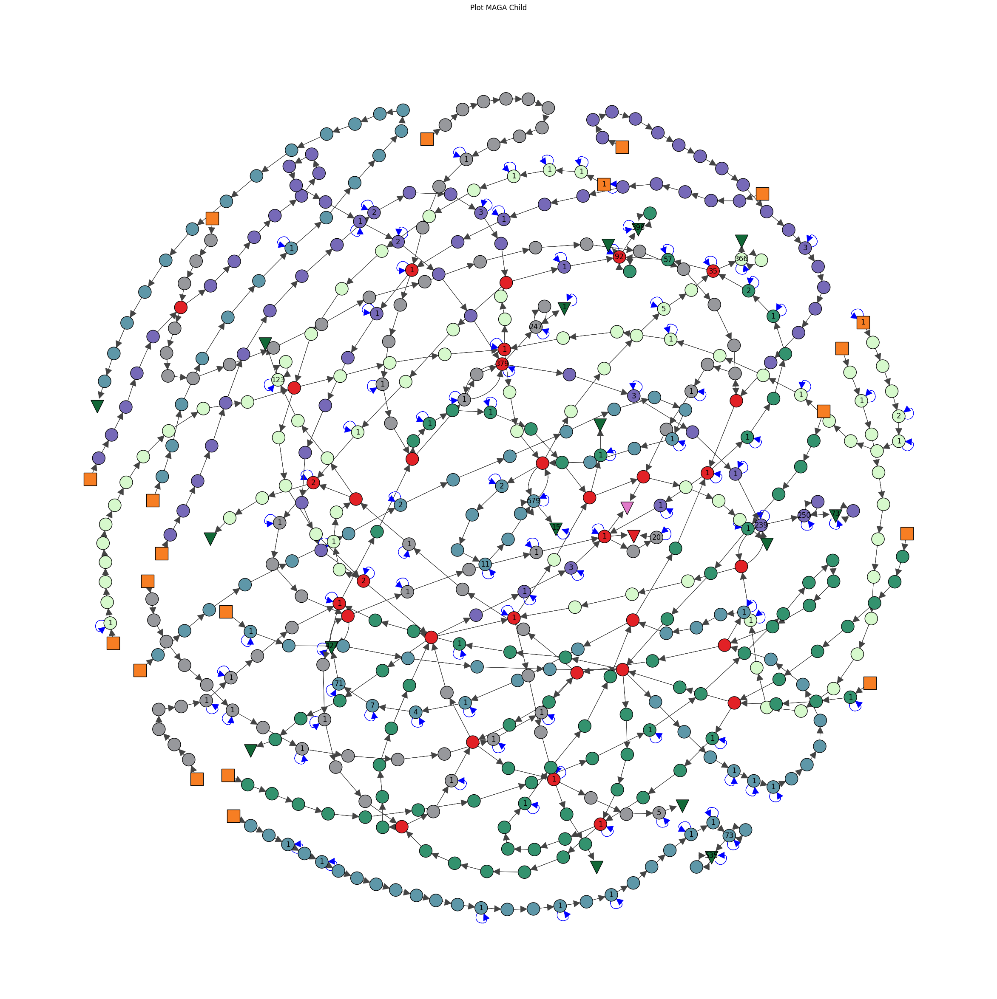

Metricas
Numero de nos: 511
Numero de edges: 650
Pontos em comum: 34
Passaram por otimo local e sairam: 0
Avarage Path Length: 14.222603399761015
Max Degree: 6
In Degree:
[0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 3, 1, 2, 2, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 3, 1, 1, 2, 1, 2, 3, 1, 4, 3, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 3, 1, 1, 1, 0, 2, 1, 1, 1, 1, 1, 3, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 2, 2, 2, 2, 3, 2, 0, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 3, 3, 1, 3, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 3, 1, 1, 2, 1, 1, 2, 3, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 2, 0, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 3, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 3, 1, 2, 2, 4, 2, 1, 1, 1, 1, 

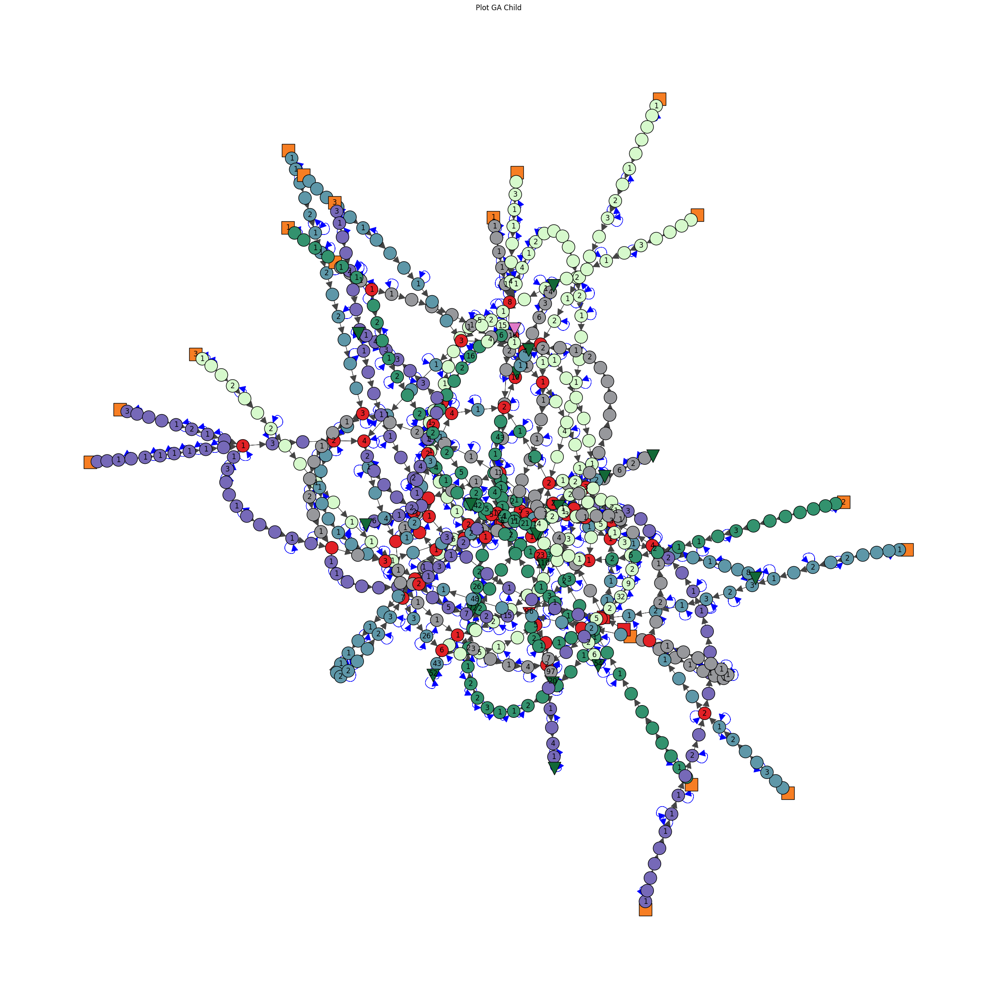

Metricas
Numero de nos: 712
Numero de edges: 1118
Pontos em comum: 63
Passaram por otimo local e sairam: 1
Avarage Path Length: 21.034647562848598
Max Degree: 6
In Degree:
[1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 2, 3, 2, 1, 1, 1, 2, 1, 2, 1, 3, 2, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 1, 1, 2, 1, 2, 2, 2, 3, 1, 1, 1, 2, 3, 2, 1, 2, 2, 2, 2, 2, 3, 1, 2, 3, 2, 2, 2, 3, 1, 4, 1, 4, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1, 1, 3, 1, 1, 2, 3, 1, 3, 2, 2, 1, 1, 1, 2, 2, 3, 2, 3, 1, 1, 1, 2, 2, 1, 2, 2, 1, 0, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 1, 1, 1, 3, 1, 3, 1, 1, 2, 1, 1, 2, 1, 1, 3, 1, 1, 2, 1, 3, 2, 3, 1, 1, 2, 1, 0, 2, 1, 1, 1, 2, 2, 2, 1, 3, 2, 2, 1, 1, 2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 1, 3, 1, 2, 3, 2, 2, 2, 1, 0, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, 2, 2, 2, 3, 2, 3, 1, 0, 2, 2, 2, 3, 2, 1, 1, 1, 2, 1, 2, 2, 3, 2, 1, 2, 2, 1, 2, 3, 3, 1, 1, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 1,

In [43]:
#g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('Test/GA/run_', '_results_asia.csv', 4, 0, 15, "Plot GA", 100)

#graphAnalysis(g, sharedP, totalS, seLoop)

#g = fullConstruction('Test/MAGA/run_', '_results_asia.csv', 4, 0, 15, "Plot MAGA")

g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('runs_MAGA/child_exp1_selflearn/run_', '_results_child.csv', 20, 0, 30, "Plot MAGA Child", 0, 0.2)
graphAnalysis(g, sharedP, totalS, seLoop)

g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('runs_GA/child_exp1/run_', '_results_child.csv', 20, 0, 30, "Plot GA Child", 0, 0.2)
graphAnalysis(g, sharedP, totalS, seLoop)



46
[0, 8, 16, 22, 25, 33, 39, 43, 47, 53, 65, 75, 70, 86, 93, 100, 105, 109, 114, 101]


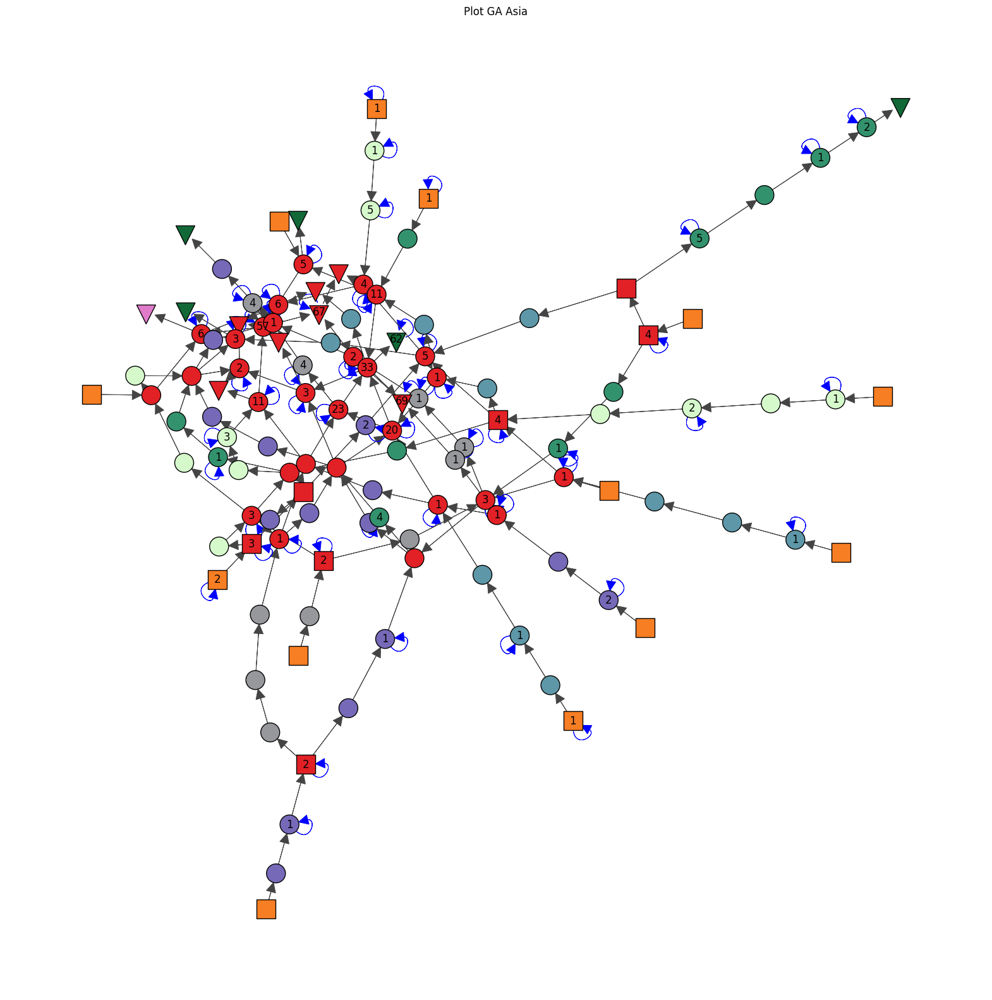

Metricas
Numero de nos: 120
Numero de edges: 213
Pontos em comum: 43
Passaram por otimo local e sairam: 14
Avarage Path Length: 5.235027516995792
Max Degree: 7
In Degree:
[2, 4, 2, 1, 2, 3, 4, 3, 0, 3, 4, 2, 2, 3, 3, 2, 1, 2, 1, 2, 2, 1, 0, 3, 1, 0, 2, 1, 3, 3, 1, 2, 2, 1, 2, 2, 3, 3, 3, 0, 2, 4, 2, 1, 1, 3, 1, 2, 1, 4, 1, 3, 1, 1, 1, 3, 1, 3, 1, 1, 3, 1, 4, 1, 1, 0, 2, 1, 2, 1, 3, 3, 4, 4, 3, 2, 1, 1, 1, 3, 2, 2, 1, 2, 1, 3, 0, 2, 1, 1, 1, 1, 3, 0, 1, 2, 1, 2, 2, 1, 1, 2, 1, 1, 1, 0, 1, 1, 2, 0, 1, 2, 2, 2, 1, 1, 2, 1, 1, 2]
Out Degree:
[3, 4, 2, 1, 2, 3, 4, 0, 1, 3, 4, 2, 2, 3, 2, 0, 2, 2, 1, 2, 2, 0, 1, 3, 0, 1, 2, 1, 3, 3, 1, 2, 0, 2, 2, 2, 3, 4, 0, 1, 2, 3, 0, 2, 1, 3, 0, 3, 1, 4, 1, 3, 0, 2, 1, 3, 1, 3, 1, 1, 3, 1, 4, 1, 0, 1, 2, 1, 2, 1, 4, 3, 3, 5, 2, 3, 1, 1, 1, 3, 2, 2, 1, 2, 1, 3, 1, 2, 1, 1, 1, 1, 3, 1, 1, 2, 1, 2, 2, 1, 2, 3, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2]
Diferenca:
[1, 0, 0, 0, 0, 0, 0, -3, 1, 0, 0, 0, 0, 0, -1, -2, 1, 0, 0, 0, 0, -1, 1, 0, -1, 1, 

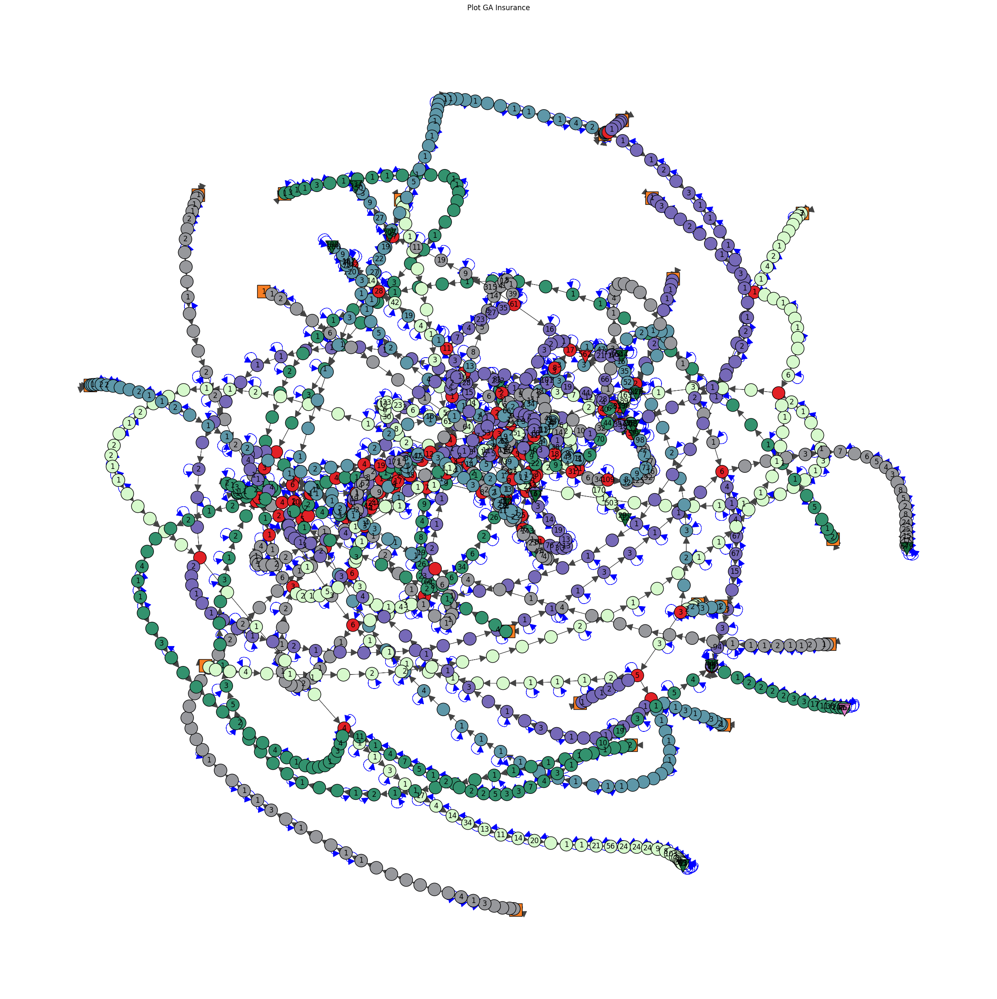

Metricas
Numero de nos: 1408
Numero de edges: 2373
Pontos em comum: 120
Passaram por otimo local e sairam: 2
Avarage Path Length: 35.21704032303024
Max Degree: 8
In Degree:
[1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 3, 2, 3, 2, 2, 2, 2, 1, 2, 2, 3, 2, 3, 2, 3, 2, 3, 2, 2, 3, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 3, 2, 1, 2, 2, 2, 1, 1, 1, 2, 1, 2, 1, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 1, 1, 2, 2, 2, 3, 2, 4, 2, 3, 1, 3, 3, 4, 3, 4, 2, 3, 2, 2, 2, 2, 2, 3, 3, 3, 3, 2, 2, 3, 2, 2, 2, 2, 2, 2, 3, 2, 1, 1, 2, 2, 2, 2, 1, 2, 1, 2, 2, 1, 2, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 2, 2, 2, 1, 2, 1, 3, 1, 2, 1, 2, 1, 2, 2, 2, 2, 3, 3, 2, 2, 2, 1, 2, 2, 4, 2, 4, 2, 3, 2, 3, 3, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 0, 2, 2, 1, 2, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 1, 1, 1, 2, 3, 2, 2, 4, 2, 3, 2, 2, 2, 2, 2, 3

In [35]:
g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('runs_GA/asia_exp1/run_', '_results_asia.csv', 20, 0, 20, "Plot GA Asia", 0, 0.2)
graphAnalysis(g, sharedP, totalS, seLoop)

g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('runs_GA/insurance_exp1_90k/insurance/run_', '_results_insurance.csv', 20, 0, 30, "Plot GA Insurance", 0, 0.5)
graphAnalysis(g, sharedP, totalS, seLoop)

52
[0, 3, 7, 8, 11, 13, 16, 20, 24, 29, 33, 35, 40, 6, 45, 46, 48, 5, 4, 58]


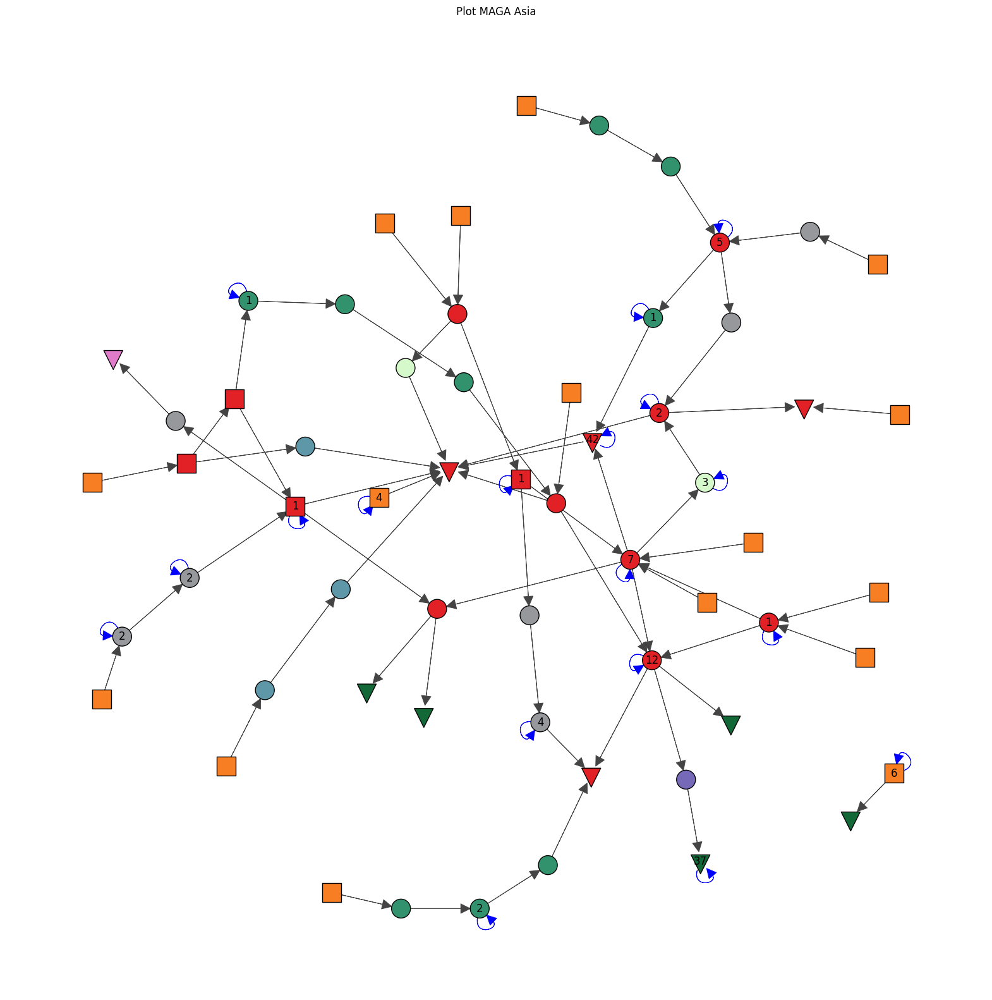

Metricas
Numero de nos: 60
Numero de edges: 85
Pontos em comum: 16
Passaram por otimo local e sairam: 14
Avarage Path Length: 2.9972602739726026
Max Degree: 8
In Degree:
[0, 2, 8, 0, 1, 1, 3, 1, 0, 1, 1, 0, 2, 0, 2, 1, 2, 1, 2, 3, 0, 1, 2, 1, 0, 3, 5, 2, 1, 0, 4, 1, 2, 0, 3, 0, 1, 3, 1, 3, 0, 1, 1, 2, 1, 0, 0, 2, 0, 2, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1]
Out Degree:
[1, 2, 0, 1, 2, 2, 4, 2, 1, 1, 1, 1, 0, 1, 2, 1, 3, 1, 2, 0, 1, 1, 2, 1, 1, 3, 5, 2, 0, 1, 4, 1, 1, 1, 2, 1, 1, 3, 1, 3, 1, 1, 1, 2, 0, 1, 1, 2, 1, 2, 2, 1, 0, 2, 1, 1, 0, 1, 2, 0]
Diferenca:
[1, 0, -8, 1, 1, 1, 1, 1, 1, 0, 0, 1, -2, 1, 0, 0, 1, 0, 0, -3, 1, 0, 0, 0, 1, 0, 0, 0, -1, 1, 0, 0, -1, 1, -1, 1, 0, 0, 0, 0, 1, 0, 0, 0, -1, 1, 1, 0, 1, 0, 0, 0, -1, 0, 0, 0, -1, 0, 1, -1]
Diametro
[3, 4, 5, 53, 54, 55, 1, 30, 31, 32]
Betwenness
[0.0, 39.0, 0.0, 0.0, 18.0, 30.0, 34.0, 0.0, 0.0, 2.0, 2.0, 0.0, 0.0, 0.0, 36.0, 3.0, 45.0, 6.0, 3.0, 0.0, 0.0, 3.0, 4.0, 3.0, 0.0, 28.0, 97.0, 34.0, 0.0, 0.0, 70.0, 19.0, 0.0, 0.0, 11.0, 0.0, 7.0,

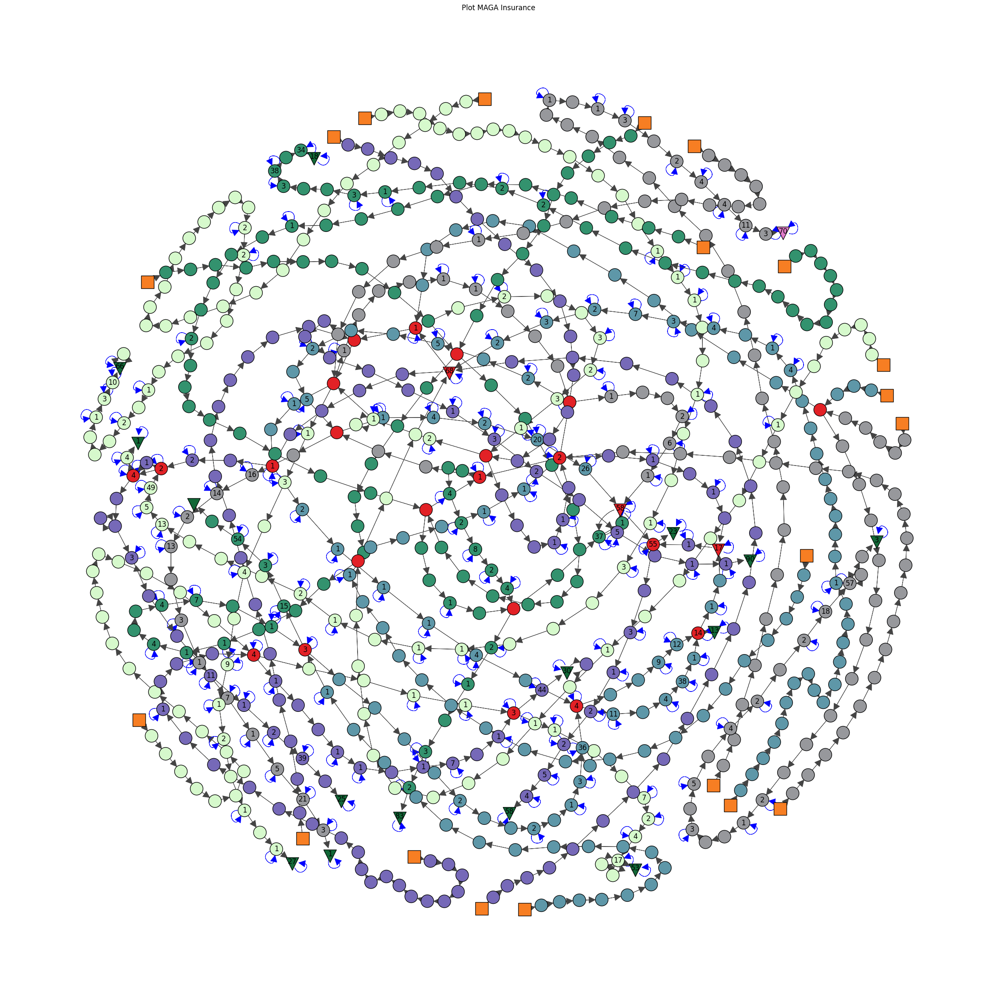

Metricas
Numero de nos: 741
Numero de edges: 974
Pontos em comum: 25
Passaram por otimo local e sairam: 4
Avarage Path Length: 21.95886443710686
Max Degree: 6
In Degree:
[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 2, 2, 3, 2, 1, 1, 2, 2, 2, 4, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 1, 1, 2, 2, 2, 2, 2, 2, 1, 3, 2, 5, 0, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 3, 2, 1, 3, 2, 2, 2, 2, 2, 1, 3, 2, 1, 2, 2, 2, 3, 2, 1, 3, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 2, 2, 3, 3, 2, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 2, 1, 2, 2, 1, 2, 2, 3, 1, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 1, 1, 2

In [37]:
g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('runs_MAGA/asia_exp1_selflearn/run_', '_results_asia.csv', 20, 0, 20, "Plot MAGA Asia", 0, 0.2)
graphAnalysis(g, sharedP, totalS, seLoop)

g, totalS, sharedP, colors, seLoop, firstsV = fullConstruction('runs_MAGA/insurance_exp1_selflearn/run_', '_results_insurance.csv', 20, 0, 30, "Plot MAGA Insurance", 0, 0.5)
graphAnalysis(g, sharedP, totalS, seLoop)

In [37]:
def edgeWeights(runs):
    weights = []
    for i in range(len(runs)):
        for j in range(len(runs[i]) - 1):
            weights.append(abs(runs[i][j] - runs[i][j + 1]))

    weigthsFinal = []

    for i in range(len(weights)):
        if(weights[i] != 0):
            weigthsFinal.append(weights[i])     

    return weights, weigthsFinal

In [38]:
def probabilityEdge(edgeMatrix, listaPre):
    uniqueEM = []
    uniqueEMLine = []
    count = []
    countLine = []

    """ for i in range(len(edgeMatrix)):
        uniqueEMLine = []
        for j in range(len(edgeMatrix[i])):
            if (edgeMatrix[i][j] not in uniqueEMLine):
                uniqueEMLine.append(edgeMatrix[i][j]) 
        uniqueEM.append(uniqueEMLine)
    
    for i in range(len(uniqueEM)):
        countLine = []
        for j in range(len(uniqueEM[i])):
            countLine.append(edgeMatrix[i].count(uniqueEM[i][j]))
        count.append(countLine)
    
    for i in range(len(uniqueEM)):
        plt.bar(uniqueEM[i], count[i])
        plt.show() """
    
    for i in range(len(edgeMatrix)):
        plt.hist(edgeMatrix[i], density=True, cumulative=-1, label=listaPre[i], alpha = 0.5)
    
    plt.legend()

## Comapra mais de um algoritmo em um mesmo grafo

In [39]:
def compare(listaPrefixos, listaSufixos, listaNumeroRuns, radial, size, title = "Comparison Graph", step = -1):
    points = []
    allRuns = []

    collectPoints = []
    collectRuns = []

    separatePoints = []
    separateRuns = []

    edgeMatrix = []
    edgeMatrixLine = []
    edgeMatrixShort = []
    edgeMatrixClean = []

    dif = []

    for i in range(len(listaPrefixos)):
        points, allRuns = getData(listaPrefixos[i], listaSufixos[i], listaNumeroRuns[i])
        collectPoints += points
        collectRuns += allRuns
        separatePoints.append(points)
        separateRuns.append(allRuns)
    
 
    newPoints = []
    newAllRuns = []

    
    newSeparatedRuns = []
    newSeparatedPoints = []
    if(step != -1):
        for i in range(len(separateRuns)):
            newPoints, newAllRuns = setVertixPace(separatePoints[i], separateRuns[i], step)
            newSeparatedPoints.append(newPoints)
            newSeparatedRuns.append(newAllRuns)

        newPoints, newAllRuns = setVertixPace(collectPoints, collectRuns, step)
    
    
    else:
        newPoints = collectPoints
        newAllRuns = collectRuns

        newSeparatedPoints = separatePoints

    print("NEW ALL RUNS")
    print(newAllRuns)

    for i in range(len(newSeparatedRuns)):
        edgeMatrixLine = []
        edgeMatrixLine, edgeMatrixShort  = edgeWeights(newSeparatedRuns[i])
        edgeMatrix.append(edgeMatrixLine)
        edgeMatrixClean.append(edgeMatrixShort)

    print("EDGE MATRIX")
    print(edgeMatrix)
    weigthEdge, weightsTotal = edgeWeights(newAllRuns)
    
    print("WEIGTH EDGE AND WEIGTH TOTAL")
    print(weigthEdge)
    print(weightsTotal)
    validValues = selectValidPoints(newPoints)

    colors, shape, totalSolutions, commonVertixes, sharedPoints, firstVertix = specialPoints(validValues, newAllRuns)
    
    testColor = []
    testFinal = []
    for i in range(len(colors)):
        testColor.append(colorsSpecial.index(colors[i]))
        if(colors[i] != colorsSpecial[5] and colors[i] != colorsSpecial[6] and colors[i] != colorsSpecial[7] and colors[i] != colorsSpecial[8]):
            
            for j in range(len(separatePoints)):
                #print(j)
                if(validValues[i] in newSeparatedPoints[j]):
                    colors[i] = colorsSpecial[j % 5]

        testFinal.append(colorsSpecial.index(colors[i]))

    
    connections, bridges, dif = edgesConstruction(newAllRuns, validValues, radial)
    print("CONNECTIONS")
    print(connections)

    connectionsFinal, selfLoops, selfLoopsLabels, bridgesOutput = selfLoopsConstruction(connections, bridges, dif)

    finalWeight = []
    counter = 0
    for i in range(len(connectionsFinal)):
        if(connectionsFinal[i][0] == connectionsFinal[i][1]):
            finalWeight.append(0)
        else:
            finalWeight.append(weightsTotal[counter])
            counter += 1

    print("CONNECTIONS FINAL AND FINAL WEIGHT")
    print(connectionsFinal)
    print(finalWeight)
    graph = buildGraph(connectionsFinal, bridgesOutput, selfLoops, selfLoopsLabels, size, title, shape, colors)

    #print("SEM LIMPAR")
    #probabilityEdge(edgeMatrix, listaPrefixos)

    #print("LIMPO")
    probabilityEdge(edgeMatrixClean, listaPrefixos)

    return graph, totalSolutions, sharedPoints
    

NEW ALL RUNS
[[1595.5, 1367.5, 1081.0, 1081.0, 954.0, 870.5, 835.0, 733.0, 714.0, 603.5, 543.0, 408.5, 366.0, 310.0, 264.5, 225.5, 225.5, 176.5, 162.5, 143.5, 78.5, 69.5, 61.5, 40.5, 25.5, 20.0, 12.0, 3.5, -9.5], [1439.5, 1304.5, 1040.0, 967.5, 930.5, 773.0, 663.0, 638.0, 585.5, 556.5, 529.0, 529.0, 520.0, 415.0, 400.0, 400.0, 361.5, 303.5, 265.0, 265.0, 246.5, 232.0, 227.5, 227.5, 207.0, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 227.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5, 189.5,

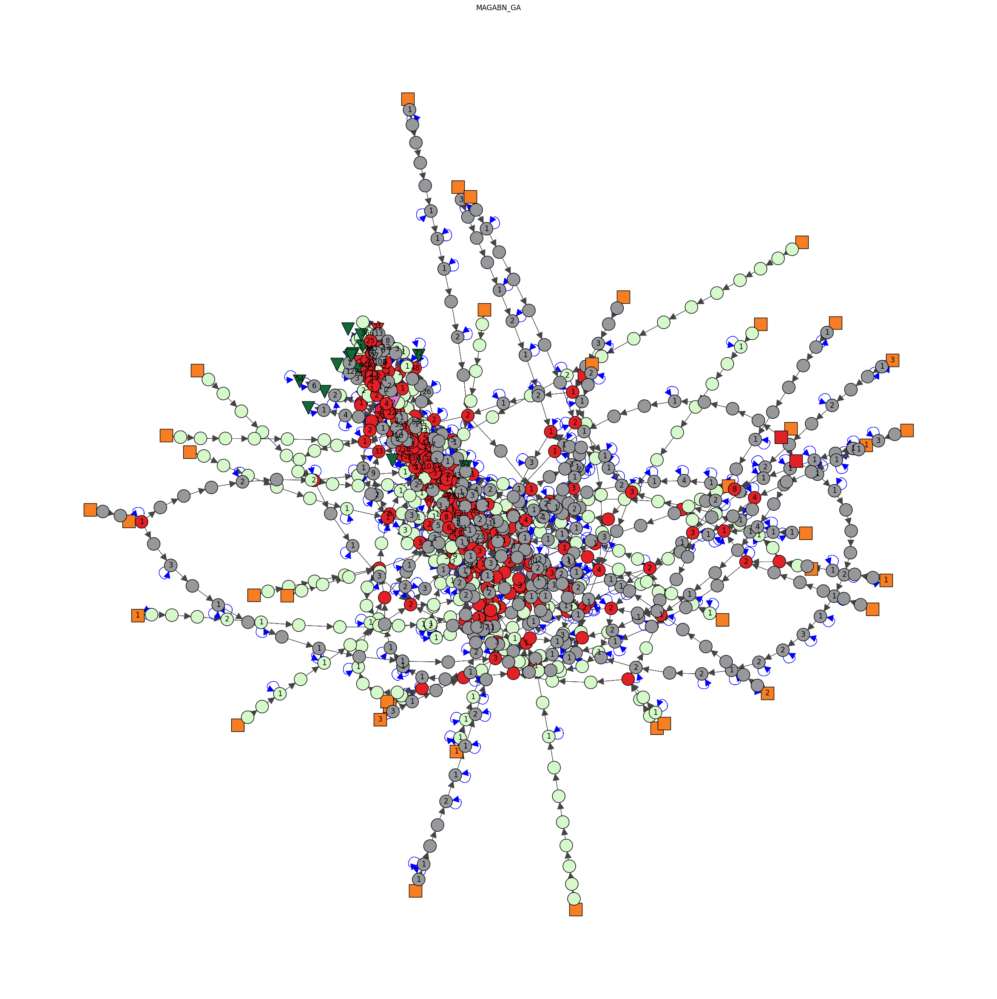

Metricas
Numero de nos: 943
Numero de edges: 1679
Pontos em comum: 256
Passaram por otimo local e sairam: 10
Avarage Path Length: 12.204080677448623
Max Degree: 12
In Degree:
[0, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 4, 2, 3, 1, 7, 1, 3, 4, 3, 4, 2, 6, 1, 1, 0, 1, 1, 2, 1, 3, 1, 1, 3, 1, 2, 1, 1, 4, 1, 1, 2, 2, 3, 4, 3, 4, 4, 1, 4, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 3, 1, 1, 4, 1, 4, 4, 6, 5, 1, 2, 2, 4, 4, 4, 5, 2, 1, 3, 1, 1, 1, 1, 4, 2, 1, 3, 3, 2, 2, 2, 1, 1, 1, 2, 3, 2, 1, 2, 1, 4, 3, 2, 3, 4, 6, 5, 0, 1, 1, 2, 1, 1, 2, 1, 3, 2, 2, 1, 1, 1, 3, 2, 1, 2, 2, 1, 1, 5, 2, 3, 4, 3, 4, 2, 1, 2, 2, 2, 1, 1, 3, 3, 3, 2, 1, 1, 3, 2, 4, 3, 4, 1, 7, 3, 1, 1, 0, 1, 2, 2, 1, 1, 3, 1, 1, 1, 1, 1, 1, 2, 4, 2, 4, 1, 3, 3, 7, 1, 3, 2, 3, 4, 0, 1, 1, 1, 1, 1, 3, 1, 2, 2, 1, 5, 1, 4, 1, 2, 4, 1, 2, 4, 2, 1, 4, 1, 2, 4, 1, 0, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 2, 1, 2, 1, 3, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 3, 4, 1, 2, 2, 4, 3, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 3, 2, 1, 1, 1, 1, 3,

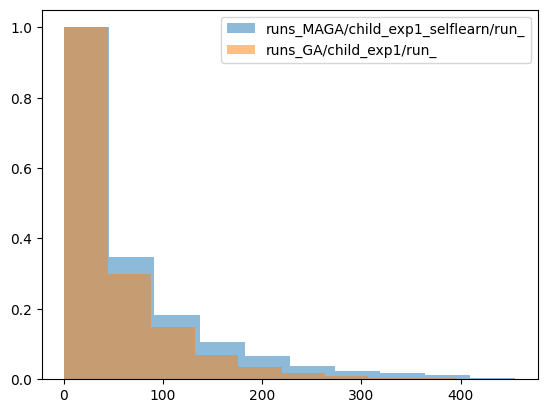

In [41]:
listaPre = ['runs_MAGA/child_exp1_selflearn/run_', 'runs_GA/child_exp1/run_']
#listaPre = ['MAGA_GA/GA/asia/run_', 'MAGA_GA/MAGA/asia_no_sf/run_']
#listaPre = ['runs_MAGA/insurance_exp1_selflearn/run_', 'runs_MAGA/asia_exp1_selflearn/run_', 'runs_MAGA/child_exp1_selflearn/run_']
#listaPre = ['Test/GA/run_', 'Test/MAGA/run_']
#listaSu = ['_results_asia.csv', '_results_asia.csv']
#listaSu = ['_results_insurance.csv','_results_asia.csv', '_results_child.csv']

listaSu = ['_results_child.csv', '_results_child.csv']
listaNum = [20, 20]

comp, totalS, sharedP  = compare(listaPre, listaSu, listaNum, 0, 30, "MAGABN_GA", 0.5)

graphAnalysis(comp, sharedP, totalS)


## Pega o SimplePath

In [44]:
def getSubgraph(g, colorsGraph, firsts):
    inDegree = []
    outDegree = []
    difference = []
    colorsSub = []
    formsSub = []
    otimoGlobal = colorsGraph.index(colorsSpecial[8])

    simplePathsMaga = g.get_all_simple_paths(otimoGlobal, firsts, -1, "in")

    subgraphVertex = []

    for i in range(len(simplePathsMaga)):
        for j in range(len(simplePathsMaga[i])):
            if(simplePathsMaga[i][j] not in subgraphVertex):
                subgraphVertex.append(simplePathsMaga[i][j])

    subGraph = g.induced_subgraph(subgraphVertex)

    print(subGraph)

    for i in range(len(subGraph.vs)):
        inDegree.append(subGraph.vs[i].indegree())
        outDegree.append(subGraph.vs[i].outdegree())
        difference.append(outDegree[i] - inDegree[i])
        if(difference[i] < 0 and outDegree[i] == 0):
            colorsSub.append(colorsSpecial[8])
            formsSub.append('triangle-down')
        elif(difference[i] > 0):
            colorsSub.append(colorsSpecial[7])
            formsSub.append('rectangle')
        else:
            colorsSub.append(colorsSpecial[3])
            formsSub.append('circle')


    fig, ax = plt.subplots(figsize=(25, 25))
    ax.set_title("Subgraph")
    ig.plot(
            subGraph,
            target=ax,
            vertex_shape = formsSub,
            vertex_color = colorsSub

        )
    #plt.show()

    print(subGraph.vs)

    return subGraph


1360
[0, 66, 152, 231, 301, 379, 446, 533, 612, 679, 762, 838, 893, 963, 1048, 1124, 1204, 1277, 1361, 1424]


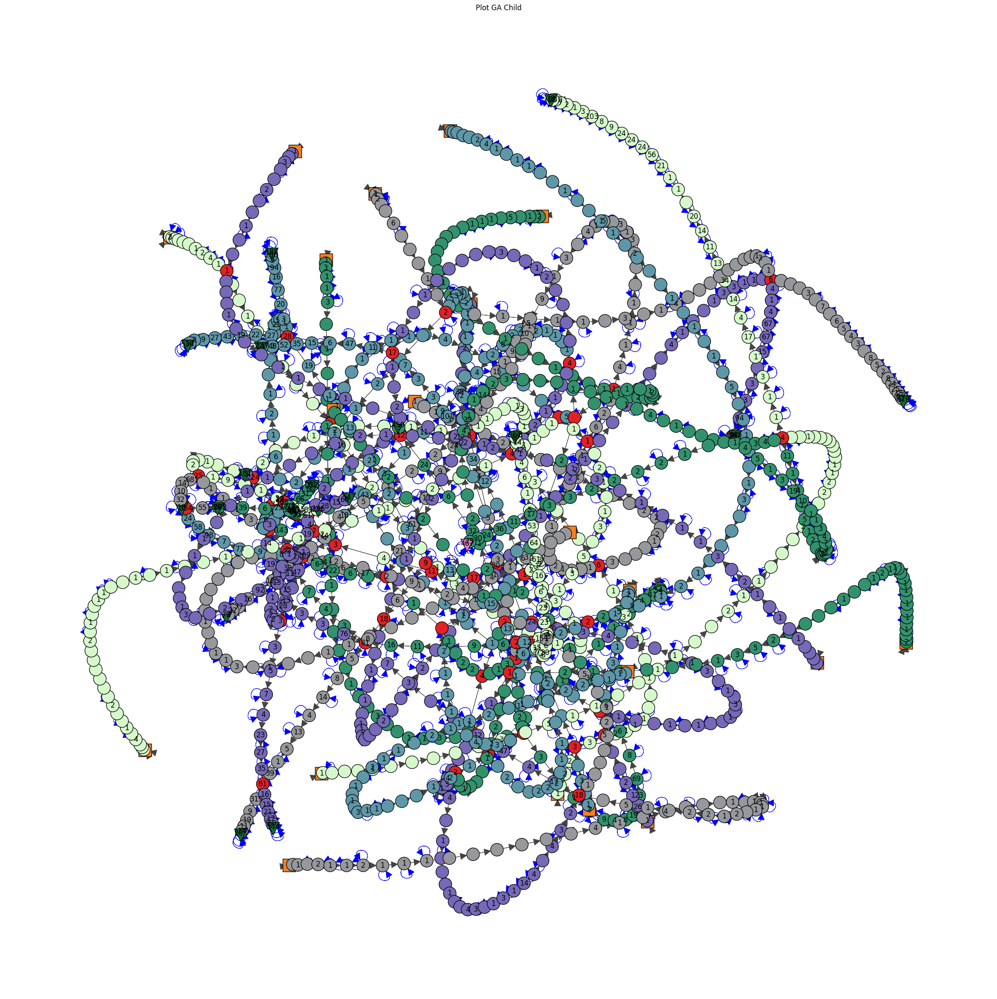

IGRAPH D--- 986 1513 --
+ attr: color (e), label (e), width (e)
+ edges:
0->0 0->1 1->1 1->2 2->3 3->4 4->5 5->6 6->7 7->7 7->8 8->8 8->9 9->9 9->10
10->10 10->11 11->12 12->13 13->14 14->14 14->15 15->16 16->17 17->17 17->18
18->19 19->20 20->21 21->21 21->22 22->23 23->23 23->24 24->24 24->25 25->26
26->27 27->27 27->28 28->28 28->29 29->29 29->30 30->31 31->32 32->33 33->34
34->34 34->35 35->35 35->36 36->37 37->38 38->39 39->39 39->40 40->41 41->41
41->42 42->42 42->43 43->43 43->44 44->44 44->45 45->45 45->46 46->46 46->47
47->47 47->48 48->49 49->49 49->50 50->50 50->51 51->51 51->52 52->52 52->53
53->53 53->54 54->54 54->55 55->55 56->56 56->57 57->58 58->59 59->59 59->60
60->60 60->61 61->61 61->62 62->63 63->63 63->64 64->65 65->66 66->67 67->67
67->68 68->69 69->70 70->71 71->71 71->72 72->72 72->73 73->74 74->74 74->75
75->75 75->76 76->77 77->78 78->79 79->79 79->80 80->80 80->81 81->81 81->82
82->83 83->83 83->84 84->84 84->85 85->85 85->86 86->87 87->88 88->89 89->89
89->

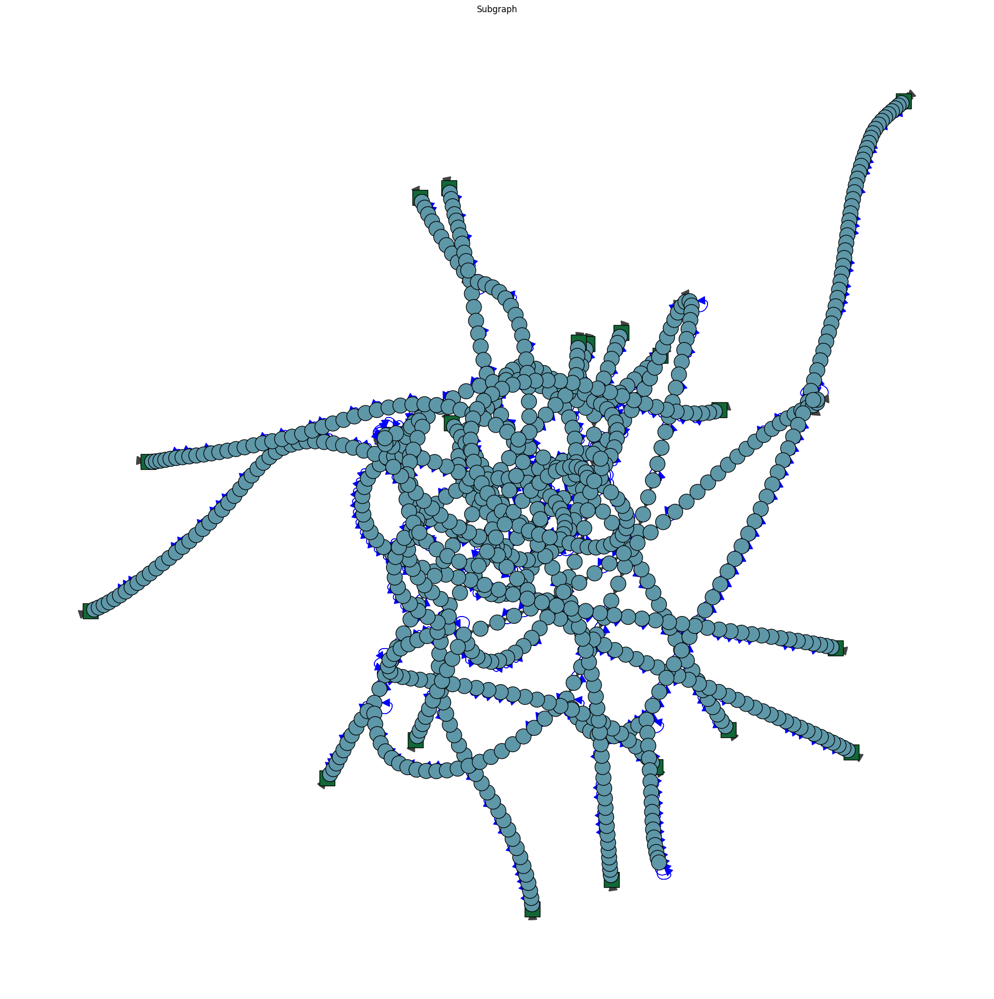

In [52]:
#g, totalS, sharedP, colorsMaga, SL, fVertixes = fullConstruction('MAGA_GA/MAGA/asia_no_sf/run_', '_results_asia.csv', 20, 0, 25, "Plot MAGA", 0, 0.5)

g, totalS, sharedP, colorsGa, seLoop, firstsV = fullConstruction('runs_GA/insurance_exp1_90k/insurance/run_', '_results_insurance.csv', 20, 0, 30, "Plot GA Child", 0, 0.2)

#g, totalS, sharedP, colorsMaga, seLoop, fVertixes = fullConstruction('runs_MAGA/child_exp1_selflearn/run_', '_results_child.csv', 20, 0, 30, "Plot MAGA Child", 0, 0.2)
#g, totalS, sharedP, colorsMaga, SL, fVertixes = fullConstruction('MAGA_GA/GA/asia/run_', '_results_asia.csv', 20, 0, 25, "Plot GA", 0, 0.5)
simplePathsMaga = getSubgraph(g, colorsGa, firstsV)
#g, totalS, sharedP = fullConstruction('MAGA_GA/GA/asia/run_', '_results_asia.csv', 20, 0, 25, "Plot GA", 0, 0.5)

#g = fullConstruction('MAGA_GA/MAGA/asia_no_sf/run_', '_results_asia.csv', 20, 1, 25, "Plot MAGA")

In [ ]:
firsts = [0, 7, 11, 20, 28, 37, 43, 50, 56, 61, 70, 78, 86, 53, 77, 74, 107, 112, 2, 119]

print(firsts)

simplePathsMaga = g.get_all_simple_paths(49, firsts, -1, "all")

print(simplePathsMaga)



In [ ]:
subgraphVertex = []

for i in range(len(simplePathsMaga)):
    for j in range(len(simplePathsMaga[i])):
        if(simplePathsMaga[i][j] not in subgraphVertex):
            subgraphVertex.append(simplePathsMaga[i][j])

subGraph = g.induced_subgraph(subgraphVertex)

print(subGraph)

fig, ax = plt.subplots(figsize=(25, 25))
ax.set_title("Subgraph")
ig.plot(
        subGraph,
        target=ax

    )
#plt.show()

print(subGraph.vs)



## Pegar o melhor valor e qual foi a run associada à ele

In [32]:
def bestSolution(points, allRuns):
    bestRun = []
    bestPoints = []

    bestValue = min(points)

    for i in range(len(allRuns)):
        if(bestValue in allRuns[i]):
            bestRun.append(allRuns[i].copy())
    
    for i in range(len(bestRun)):
        for j in range(len(bestRun[i])):
            if(bestRun[i][j] not in bestPoints):
                bestPoints.append(bestRun[i][j])


    return bestValue, bestRun, bestPoints

## Constroi tudo baseado só nos pontos e nas runs

In [33]:
def buildAll(points, allRuns, radial, size, title, step = -1):
    newPoints = []
    newAllRuns = []
    if(step != -1):
        newPoints, newAllRuns = setVertixPace(points, allRuns, step)

    else:
        newPoints = points
        newAllRuns = allRuns
    validValues = selectValidPoints(newPoints)

    colors, shape, totalSolutions, commonVertixes, sharedPoints = specialPoints(validValues, newAllRuns)

    connections, bridges = edgesConstruction(newAllRuns, validValues, radial)

    connectionsFinal, selfLoops, selfLoopsLabels, bridgesOutput = selfLoopsConstruction(connections, bridges)

    graph = buildGraph(connectionsFinal, bridgesOutput, selfLoops, selfLoopsLabels, size, title, shape, colors)

In [ ]:
bestValue, bestRun, bestPoints = bestSolution(points, allRuns)

print(bestValue)

print(bestRun)

print(bestPoints)

buildAll(bestPoints, bestRun, 0, 20, "Best Value Run", 1)


## Pega a Menor Run

In [35]:
def shortestRun(allRuns):
    shortestRun = []

    minValue = 1000
    for i in range(len(allRuns)):
        if(len(allRuns[i]) < minValue):
            shortestRun = allRuns[i].copy()
            minValue = len(allRuns[i])
    
    return minValue, shortestRun

In [ ]:
minPath, shortestPath = shortestRun(allRuns)

print(minPath)
print(shortestPath)

run = []

run.append(shortestPath)

buildAll(shortestPath, run, 0, 10, "Shortest Run GA", 1)



## Principal para implementação
* Comparar com o MAGA - jeito de separar as runs

* Metricas de in degree e out degree - Não implementadas, mas tem no caderninho


## Principal para estudo antes de implementar
* Metricas de grafo
* Constancia na evolução(correlação do grau do vertices com peso nas arestas PESSOAS CM MTA INFLUENCIA CONECTAM COM PESSOAS DE MTA INFLUENCIA)


### Peso da aresta (ver também sobre largura da aresta) -> é por vetor, igual as cores

    -> Start a list of all edge widths, defaulted to width of 3
    widths = [3] * len(g.es)

    -> Find edge ID
    start_vertex = g.vs.find(name = start_name).index
    end_vertex   = g.vs.find(name = end_name).index
    edge_index   = g.get_eid(start_vertex, end_vertex)

    -> Change the width for the edge required
    widths[edge_index] = 20

    -> Update the graph with the list of widths
    g.es['width'] = widths
* Diametro
* Refletir sobre pontos importantes pro grafo 

## Mahomenos

* Bipartida 
* Vertice com textura - Não encontrei nada sobre textura no networkx nem no igraph
* Grafico de distribuição de probabilidade dos graus

peso da aresta pra calcular as metrica (degree pesado, diametro, caminho medio)

TABEL cm peso e sem peso
    cm loop e sem loop

Labirinto

Fazer la o grafico com o betwenness (faz dos 2 pra ser interessante, o mapa de calor e com o label pra ver qual q fica mlr)
Pensar mlr nos resultados de como q poderia usar as metricas pra analisar o metodo em melhorias locais e melhorias globais
Escrever 